# Homework 01
## Notebook 3 - Appendix.

Components of the Group:

    Crnigoj Gabriele 134176
    Ferraro Tommaso 132998
    Stinat Kevin 134905
 
 
<font color='green'>Note</font>: this is only an other way to execute the Homework 1, where we delete from the DataFrame of the frequencies the cluster of films without any synopsis. We also print other type of graphs about Kmeans clustering algorithm. The conclusion of the Apendix can be found into the Notebook 2.

## Step 1: preparation for clustering

<font color='red'>**Comment:**</font> we delete from the matrix the cluster which contain the films that we discuss in the note above and we do again from the exercise 10 to 12. For the steps instructions, check Notebook 2

In [1]:
import pandas as pd
import os
from tqdm import tqdm
import joblib

In [2]:
from tempfile import mkdtemp
savedir = 'tf_idfmatrix'

In [3]:
filename = os.path.join(savedir, 'tf_idfmatrix_file') 

with open(filename,'rb') as r:
    temp = joblib.load(r)
    
temp.head()

,The Godfather,The Shawshank Redemption,Schindler's List,Raging Bull,Casablanca,Citizen Kane,Gone with the Wind,The Wizard of Oz,One Flew Over the Cuckoo's Nest,Lawrence of Arabia,...,The Great Dictator,Double Indemnity,The Maltese Falcon,Wuthering Heights,Taxi Driver,Rear Window,The Third Man,Rebel Without a Cause,North by Northwest,Yankee Doodle Dandy
abandon,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.146868,...,0.061641,0.0,0.00000,0.0,0.0,0.000000,0.000000,0.046527,0.032028,0.0
abl,0.000000,0.031679,0.045263,0.000000,0.0,0.000000,0.017478,0.0,0.044618,0.000000,...,0.000000,0.0,0.00000,0.0,0.0,0.000000,0.000000,0.000000,0.015240,0.0
accept,0.036546,0.000000,0.000000,0.000000,0.0,0.000000,0.030619,0.0,0.039084,0.000000,...,0.000000,0.0,0.05939,0.0,0.0,0.000000,0.027371,0.000000,0.000000,0.0
accompani,0.022303,0.000000,0.000000,0.054811,0.0,0.000000,0.018686,0.0,0.000000,0.000000,...,0.000000,0.0,0.00000,0.0,0.0,0.037763,0.016704,0.000000,0.016294,0.0
across,0.000000,0.000000,0.000000,0.046831,0.0,0.078485,0.047896,0.0,0.000000,0.000000,...,0.000000,0.0,0.00000,0.0,0.0,0.161323,0.028544,0.000000,0.013921,0.0


In [4]:
tf_idfmatrix = temp.T
tf_idfmatrix.head()

,abandon,abl,accept,accompani,across,act,action,admit,afterward,agre,...,woman,women,word,work,world,would,wound,year,york,young
The Godfather,0.0,0.000000,0.036546,0.022303,0.000000,0.020218,0.000000,0.020534,0.022303,0.066700,...,0.016468,0.000000,0.021920,0.000000,0.019333,0.059863,0.0,0.073131,0.020861,0.063500
The Shawshank Redemption,0.0,0.031679,0.000000,0.000000,0.000000,0.015352,0.017556,0.000000,0.016935,0.063307,...,0.012504,0.017238,0.033288,0.119345,0.014679,0.034091,0.0,0.155481,0.000000,0.012054
Schindler's List,0.0,0.045263,0.000000,0.000000,0.000000,0.000000,0.050167,0.000000,0.000000,0.000000,...,0.071464,0.344817,0.000000,0.056839,0.083894,0.032472,0.0,0.000000,0.000000,0.000000
Raging Bull,0.0,0.000000,0.000000,0.054811,0.046831,0.000000,0.000000,0.050463,0.000000,0.000000,...,0.000000,0.000000,0.053870,0.000000,0.000000,0.000000,0.0,0.107835,0.051267,0.000000
Casablanca,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.064555,0.038574,0.113870,0.088149,0.0,0.043075,0.122871,0.000000


In [5]:
from sklearn.cluster import KMeans

n_cluster = 5

kmeans = KMeans(n_clusters = n_cluster).fit_predict(tf_idfmatrix)
kmeans

array([4, 4, 1, 4, 4, 4, 4, 4, 4, 1, 4, 4, 4, 4, 4, 4, 3, 4, 0, 1, 4, 4,
       4, 3, 1, 0, 4, 1, 4, 4, 1, 4, 1, 1, 3, 1, 1, 4, 1, 4, 4, 0, 4, 0,
       4, 4, 4, 4, 4, 3, 1, 4, 1, 1, 4, 1, 4, 1, 1, 4, 4, 4, 4, 4, 2, 4,
       4, 4, 4, 4, 4, 4, 4, 4, 4, 4, 2, 1, 4, 4, 4, 4, 4, 4, 4, 4, 4, 3,
       2, 2, 1, 4, 4, 2, 4, 4, 4, 4, 4, 2])

In [6]:
title_and_cluster = pd.DataFrame({'title': tf_idfmatrix.index, 'cluster': kmeans })
title_and_cluster.head()

,title,cluster
0,The Godfather,4
1,The Shawshank Redemption,4
2,Schindler's List,1
3,Raging Bull,4
4,Casablanca,4


In [7]:
df_merge = tf_idfmatrix.merge(title_and_cluster, left_index = True, right_on = 'title').set_index('title')
df_merge.head()

,abandon,abl,accept,accompani,across,act,action,admit,afterward,agre,...,women,word,work,world,would,wound,year,york,young,cluster
title,,,,,,,,,,,,,,,,,,,,,
The Godfather,0.0,0.000000,0.036546,0.022303,0.000000,0.020218,0.000000,0.020534,0.022303,0.066700,...,0.000000,0.021920,0.000000,0.019333,0.059863,0.0,0.073131,0.020861,0.063500,4
The Shawshank Redemption,0.0,0.031679,0.000000,0.000000,0.000000,0.015352,0.017556,0.000000,0.016935,0.063307,...,0.017238,0.033288,0.119345,0.014679,0.034091,0.0,0.155481,0.000000,0.012054,4
Schindler's List,0.0,0.045263,0.000000,0.000000,0.000000,0.000000,0.050167,0.000000,0.000000,0.000000,...,0.344817,0.000000,0.056839,0.083894,0.032472,0.0,0.000000,0.000000,0.000000,1
Raging Bull,0.0,0.000000,0.000000,0.054811,0.046831,0.000000,0.000000,0.050463,0.000000,0.000000,...,0.000000,0.053870,0.000000,0.000000,0.000000,0.0,0.107835,0.051267,0.000000,4
Casablanca,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.064555,0.038574,0.113870,0.088149,0.0,0.043075,0.122871,0.000000,4


In [8]:
for k in df_merge.index:
    if df_merge.cluster[k] == 3:
           df_merge = df_merge.drop(index = k)

df_merge = df_merge.drop(columns = 'cluster')
df_merge.shape

(95, 475)

In [9]:
df_merge.head()

,abandon,abl,accept,accompani,across,act,action,admit,afterward,agre,...,woman,women,word,work,world,would,wound,year,york,young
title,,,,,,,,,,,,,,,,,,,,,
The Godfather,0.0,0.000000,0.036546,0.022303,0.000000,0.020218,0.000000,0.020534,0.022303,0.066700,...,0.016468,0.000000,0.021920,0.000000,0.019333,0.059863,0.0,0.073131,0.020861,0.063500
The Shawshank Redemption,0.0,0.031679,0.000000,0.000000,0.000000,0.015352,0.017556,0.000000,0.016935,0.063307,...,0.012504,0.017238,0.033288,0.119345,0.014679,0.034091,0.0,0.155481,0.000000,0.012054
Schindler's List,0.0,0.045263,0.000000,0.000000,0.000000,0.000000,0.050167,0.000000,0.000000,0.000000,...,0.071464,0.344817,0.000000,0.056839,0.083894,0.032472,0.0,0.000000,0.000000,0.000000
Raging Bull,0.0,0.000000,0.000000,0.054811,0.046831,0.000000,0.000000,0.050463,0.000000,0.000000,...,0.000000,0.000000,0.053870,0.000000,0.000000,0.000000,0.0,0.107835,0.051267,0.000000
Casablanca,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.064555,0.038574,0.113870,0.088149,0.0,0.043075,0.122871,0.000000


## Step 2: Clustering with differents algorithms

In [10]:
from sklearn.cluster import AgglomerativeClustering as AC
from sklearn import metrics
import matplotlib.pyplot as plt
import seaborn as sns

**AGGLOMERATIVE CLUSTERING**

In [11]:
labels_average = AC(n_clusters = 5, affinity = 'cosine', linkage = 'average').fit_predict(df_merge)
labels_average

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 3, 0,
       0, 4, 0, 2, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 1], dtype=int64)

In [12]:
metrics.silhouette_score(df_merge, labels_average, metric = 'cosine')

0.14849811695348966

In [13]:
silhouette_df = pd.DataFrame({'n_clusters':[x for x in range(2,11)]})

for i in range(0,9):  #the dataframe 8 rows
    
    temp_clustering = AC(n_clusters = silhouette_df.n_clusters[i], affinity = 'cosine', linkage = 'average').fit_predict(df_merge)
    
    silhouette_df.loc[[i],'score'] = metrics.silhouette_score(df_merge, temp_clustering, metric = 'cosine')

In [14]:
silhouette_df

,n_clusters,score
0,2,0.276231
1,3,0.198639
2,4,0.179580
3,5,0.148498
4,6,0.130593
5,7,0.117981
6,8,0.103232
7,9,0.100947
8,10,0.089115


Text(0.5, 1.0, 'Elbow Method AgglomerativeClustering (Average)')

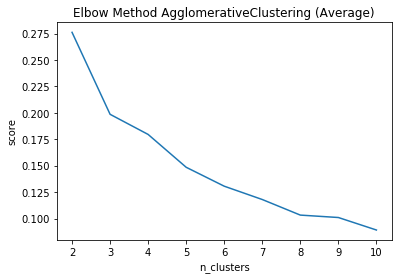

In [15]:
sns.lineplot(x = 'n_clusters', y = 'score', data = silhouette_df)
plt.title('Elbow Method AgglomerativeClustering (Average)')

In [16]:
labels_complete = AC(n_clusters = 5, affinity = 'cosine', linkage = 'complete').fit_predict(df_merge)
labels_complete

array([0, 0, 1, 4, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 4, 4, 1, 0, 1, 1, 0, 1,
       1, 1, 0, 1, 0, 0, 0, 1, 0, 4, 0, 0, 1, 1, 0, 0, 0, 0, 3, 1, 1, 0,
       0, 0, 1, 1, 0, 0, 0, 0, 1, 4, 0, 1, 0, 0, 0, 0, 2, 4, 4, 0, 0, 0,
       0, 1, 4, 3, 0, 0, 2, 0, 0, 1, 4, 1, 0, 0, 0, 4, 0, 2, 2, 1, 1, 0,
       2, 0, 0, 0, 4, 0, 2], dtype=int64)

In [17]:
metrics.silhouette_score(df_merge, labels_complete, metric = 'cosine')

0.09101875291419496

In [18]:
silhouette_df = pd.DataFrame({'n_clusters':[x for x in range(2,11)]})

for i in range(0,9):  #the dataframe 8 rows
    
    temp_clustering = AC(n_clusters = silhouette_df.n_clusters[i], affinity = 'cosine', linkage = 'complete').fit_predict(df_merge)
    
    silhouette_df.loc[[i],'score'] = metrics.silhouette_score(df_merge, temp_clustering, metric = 'cosine')

In [19]:
silhouette_df

,n_clusters,score
0,2,0.241060
1,3,0.198639
2,4,0.089367
3,5,0.091019
4,6,0.087829
5,7,0.087816
6,8,0.090165
7,9,0.086427
8,10,0.086745


Text(0.5, 1.0, 'Elbow Method AgglomerativeClustering (complete)')

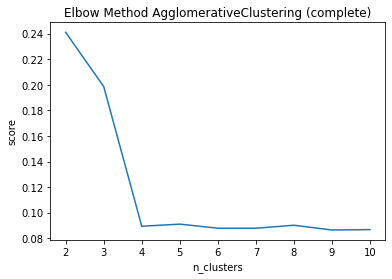

In [20]:
sns.lineplot(x = 'n_clusters', y = 'score', data = silhouette_df)
plt.title('Elbow Method AgglomerativeClustering (complete)')

In [21]:
labels_single = AC(n_clusters = 5, affinity = 'cosine', linkage = 'single').fit_predict(df_merge)
labels_single

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 2, 0,
       0, 4, 0, 0, 0, 0, 1, 0, 0, 0, 0, 3, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 1], dtype=int64)

In [22]:
metrics.silhouette_score(df_merge, labels_single, metric = 'cosine')

0.12377932064159876

In [23]:
silhouette_df = pd.DataFrame({'n_clusters':[x for x in range(2,11)]})

for i in range(0,9):  #the dataframe 8 rows
    
    temp_clustering = AC(n_clusters = silhouette_df.n_clusters[i], affinity = 'cosine', linkage = 'single').fit_predict(df_merge)
    
    silhouette_df.loc[[i],'score'] = metrics.silhouette_score(df_merge, temp_clustering, metric = 'cosine')

In [24]:
silhouette_df

,n_clusters,score
0,2,0.276231
1,3,0.188560
2,4,0.132741
3,5,0.123779
4,6,0.119592
5,7,0.110772
6,8,0.110636
7,9,0.105005
8,10,0.098216


Text(0.5, 1.0, 'Elbow Method AgglomerativeClustering (single)')

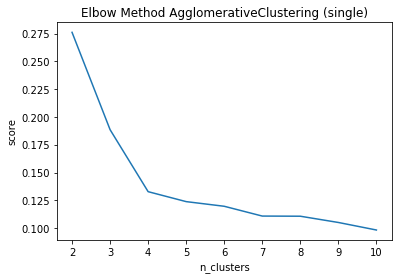

In [25]:
sns.lineplot(x = 'n_clusters', y = 'score', data = silhouette_df)
plt.title('Elbow Method AgglomerativeClustering (single)')

**KMEANS with 5 clusters**

In [26]:
from sklearn.cluster import KMeans

n_cluster = 5

kmeans = KMeans(n_clusters = n_cluster).fit_predict(df_merge)
kmeans

array([3, 0, 1, 0, 4, 0, 4, 0, 0, 1, 0, 0, 3, 0, 3, 3, 0, 0, 0, 0, 0, 3,
       1, 0, 0, 1, 0, 0, 1, 3, 4, 3, 4, 4, 0, 4, 0, 3, 3, 0, 3, 4, 0, 0,
       3, 4, 1, 4, 4, 4, 3, 1, 4, 3, 4, 1, 0, 3, 3, 4, 2, 3, 3, 4, 3, 0,
       0, 0, 3, 4, 0, 3, 2, 3, 0, 0, 0, 3, 0, 0, 0, 3, 0, 2, 2, 1, 0, 0,
       2, 0, 0, 0, 3, 0, 2])

In [27]:
metrics.silhouette_score(df_merge, kmeans)

0.08017677059665708

In [28]:
silhouette_kmeans = pd.DataFrame({'n_clusters':[x for x in range(2,11)]})

for i in range(0,9):  #the dataframe 8 rows
    
    temp_clustering = KMeans(n_clusters = silhouette_kmeans.n_clusters[i], random_state = 0).fit_predict(df_merge)
    
    silhouette_kmeans.loc[[i],'score'] = metrics.silhouette_score(df_merge, temp_clustering)

silhouette_kmeans

,n_clusters,score
0,2,0.178294
1,3,0.087338
2,4,0.087199
3,5,0.084068
4,6,0.072462
5,7,0.082822
6,8,0.086443
7,9,0.082041
8,10,0.080578


Text(0.5, 1.0, 'Elbow Method Kmeans')

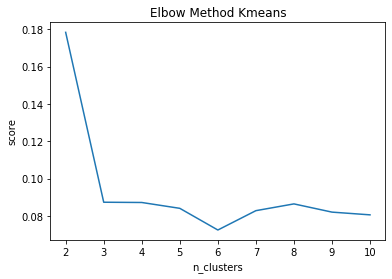

In [29]:
sns.lineplot(x ='n_clusters', y = 'score', data = silhouette_kmeans)
plt.title('Elbow Method Kmeans')

<font color='red'>**Comment:**</font> for the same reason of the Notebook 2, we choose Kmean as the best algorithm to cluster the film's synopsis. We decide to use 5 clusters because of the graph of the elbow method above.

In [30]:
title_and_cluster = pd.DataFrame({'title': df_merge.index, 'cluster': kmeans })
title_and_cluster.head()

,title,cluster
0,The Godfather,3
1,The Shawshank Redemption,0
2,Schindler's List,1
3,Raging Bull,0
4,Casablanca,4


In [31]:
title_and_cluster.cluster.value_counts()

0    40
3    24
4    16
1     9
2     6
Name: cluster, dtype: int64

In [32]:
df_merge.describe()

,abandon,abl,accept,accompani,across,act,action,admit,afterward,agre,...,woman,women,word,work,world,would,wound,year,york,young
count,95.000000,95.000000,95.000000,95.000000,95.000000,95.000000,95.000000,95.000000,95.000000,95.000000,...,95.000000,95.000000,95.000000,95.000000,95.000000,95.000000,95.000000,95.000000,95.000000,95.000000
mean,0.013212,0.011531,0.015600,0.010051,0.015353,0.011769,0.009117,0.010111,0.012020,0.021005,...,0.025997,0.015994,0.011839,0.034684,0.022530,0.028320,0.017597,0.026289,0.017982,0.024287
std,0.027870,0.022665,0.026940,0.023948,0.028125,0.024073,0.022195,0.020659,0.027196,0.030738,...,0.042647,0.046352,0.026191,0.043774,0.046017,0.036686,0.038564,0.034744,0.040091,0.035862
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.024614,0.000000,0.010933,0.000000,0.008393,0.000000,0.000000
75%,0.000000,0.011246,0.027705,0.000000,0.029012,0.013272,0.000000,0.005642,0.000000,0.038743,...,0.037353,0.000000,0.000000,0.044100,0.026413,0.051299,0.000000,0.041514,0.016448,0.037667
max,0.146868,0.098458,0.119320,0.173392,0.161323,0.104788,0.119835,0.104021,0.145634,0.125342,...,0.184554,0.344817,0.135424,0.193730,0.271825,0.139134,0.215045,0.155481,0.229369,0.163556


In [33]:
def find_words_max_frequenties_of_one_cluster (n_max, cluster_number, df_idfmatrix, title_and_cluster):
    
        temp_df = df_idfmatrix.merge(title_and_cluster, left_index = True, right_on = 'title').set_index('title')
        
        #find every title that belongs to the 'cluster_number'
        for i in temp_df.index:
            if temp_df.cluster[i] != cluster_number:
                temp_df = temp_df.drop(index = i) 
                
        temp_df = temp_df.drop(columns = 'cluster')        
        alfa = dict(temp_df.sum())
        
        beta = dict(sorted(alfa.items(), reverse = True, key = lambda x: (x[1],x[0]))[:n_max])
        
        return beta

In [34]:
title_and_cluster_average = pd.DataFrame({'title': df_merge.index, 'cluster': labels_average })
title_and_cluster_average.head()

,title,cluster
0,The Godfather,0
1,The Shawshank Redemption,0
2,Schindler's List,0
3,Raging Bull,0
4,Casablanca,0


In [35]:
print('Cluster partition Agglomerative Clustering (Average): \n\n')

for k in range(n_cluster):
    
    #Print the most common words in cluster k
    sentenceW = 'Cluster {} most frequent words: '.format(k)
    top_words_cluster_k = find_words_max_frequenties_of_one_cluster(5, k, df_merge, title_and_cluster_average)
    sentenceW = sentenceW + ', '.join(top_words_cluster_k.keys())
    print (sentenceW, end ='.\n\n')

    #print films that belong to the k cluster
    sentenceT = 'Cluster {} titles: '.format(k)
    for a, i in enumerate(title_and_cluster_average.index):
        if title_and_cluster_average['cluster'][i] == k:
            sentenceT = sentenceT + title_and_cluster_average['title'][i] + ', '
    print(sentenceT[:-2], end ='.\n\n')

Cluster partition Agglomerative Clustering (Average): 


Cluster 0 most frequent words: tell, find, get, see, man.

Cluster 0 titles: The Godfather, The Shawshank Redemption, Schindler's List, Raging Bull, Casablanca, Citizen Kane, Gone with the Wind, The Wizard of Oz, One Flew Over the Cuckoo's Nest, Lawrence of Arabia, Vertigo, Psycho, The Godfather: Part II, On the Waterfront, Sunset Blvd., Forrest Gump, 12 Angry Men, West Side Story, Star Wars: Episode IV - A New Hope, 2001: A Space Odyssey, E.T. the Extra-Terrestrial, The Silence of the Lambs, The Bridge on the River Kwai, Singin' in the Rain, It's a Wonderful Life, Dr. Strangelove or: How I Learned to Stop Worrying and Love the Bomb, Some Like It Hot, Ben-Hur, Apocalypse Now, Amadeus, The Lord of the Rings: The Return of the King, Gladiator, From Here to Eternity, Saving Private Ryan, Unforgiven, Raiders of the Lost Ark, Rocky, A Streetcar Named Desire, The Philadelphia Story, To Kill a Mockingbird, The Best Years of Our Lives, M

In [36]:
print('Cluster partition Kmeans: \n\n')

for k in range(n_cluster):
    
    #Print the most common words in cluster k
    sentenceW = 'Cluster {} most frequent words: '.format(k)
    top_words_cluster_k = find_words_max_frequenties_of_one_cluster(5, k, df_merge, title_and_cluster)
    sentenceW = sentenceW + ', '.join(top_words_cluster_k.keys())
    print (sentenceW, end ='.\n\n')

    #print films that belong to the k cluster
    sentenceT = 'Cluster {} titles: '.format(k)
    for a, i in enumerate(title_and_cluster.index):
        if title_and_cluster['cluster'][i] == k:
            sentenceT = sentenceT + title_and_cluster['title'][i] + ', '
    print(sentenceT[:-2], end ='.\n\n')

Cluster partition Kmeans: 


Cluster 0 most frequent words: tell, get, say, see, go.

Cluster 0 titles: The Shawshank Redemption, Raging Bull, Citizen Kane, The Wizard of Oz, One Flew Over the Cuckoo's Nest, Vertigo, Psycho, On the Waterfront, 12 Angry Men, West Side Story, Star Wars: Episode IV - A New Hope, 2001: A Space Odyssey, E.T. the Extra-Terrestrial, Singin' in the Rain, It's a Wonderful Life, Some Like It Hot, Ben-Hur, Unforgiven, Rocky, To Kill a Mockingbird, My Fair Lady, A Clockwork Orange, The Exorcist, A Place in the Sun, Midnight Cowboy, Mr. Smith Goes to Washington, Fargo, The Green Mile, Close Encounters of the Third Kind, Nashville, The Graduate, American Graffiti, Pulp Fiction, Good Will Hunting, Double Indemnity, The Maltese Falcon, Taxi Driver, Rear Window, The Third Man, North by Northwest.

Cluster 1 most frequent words: command, war, soldier, offic, american.

Cluster 1 titles: Schindler's List, Lawrence of Arabia, The Bridge on the River Kwai, Dr. Strangelove 

## Step 3: Qualitative Plotting

<font color='red'>**Comment:**</font> we used funtion that were already made. For this porpouse we aligned them to the input data of our Notebook

In [37]:
import matplotlib.pyplot as plt
import matplotlib as mpl
from sklearn.manifold import MDS

In [38]:
#affinity cosine analysis
from sklearn.metrics.pairwise import cosine_similarity
dist = 1 - cosine_similarity(df_merge)

In [39]:
MDS()
mds = MDS(n_components=2, dissimilarity="precomputed", random_state=1)
pos = mds.fit_transform(dist)  # shape (n_components, n_samples)
xs, ys = pos[:, 0], pos[:, 1]

In [40]:
#set up colors per clusters using a dict (or cluster)

cluster_colors = {0: '#1b9e77', 1: '#d95f02', 2: '#7570b3', 3: '#e7298a', 4: '#66a61e', 5: '#021bd9', 
                  6: '#ff0400', 7: '#03ecfc' }

#set up cluster names using a dict
cluster_names = {0: '0', 
                 1: '1', 
                 2: '2', 
                 3: '3', 
                 4: '4',
                 5: '5',
                 6: '6',
                 7: '7'}

C:\Users\Kevin\Anaconda3\lib\site-packages\ipykernel_launcher.py:39: DeprecationWarning: 
.ix is deprecated. Please use
.loc for label based indexing or
.iloc for positional indexing

See the documentation here:
http://pandas.pydata.org/pandas-docs/stable/indexing.html#ix-indexer-is-deprecated


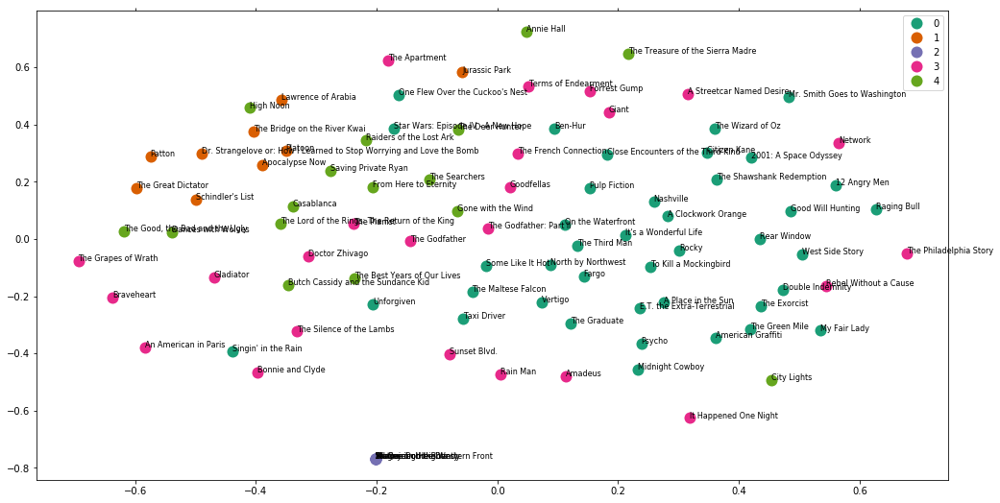

In [41]:
#some ipython magic to show the matplotlib plots inline
%matplotlib inline 

#create data frame that has the result of the MDS plus the cluster numbers and titles
df1 = pd.DataFrame(dict(x=xs, y=ys, label= list(title_and_cluster['cluster']) , title=list(title_and_cluster['title']))) 

#group by cluster
groups = df1.groupby('label')


# set up plot
fig, ax = plt.subplots(figsize=(17, 9)) # set size
ax.margins(0.05) # Optional, just adds 5% padding to the autoscaling

#iterate through groups to layer the plot
#note that I use the cluster_name and cluster_color dicts with the 'name' lookup to return the appropriate color/label
for name, group in groups:
    ax.plot(group.x, group.y, marker='o', linestyle='', ms=12, 
            label=cluster_names[name], color=cluster_colors[name], 
            mec='none')
    ax.set_aspect('auto')
    ax.tick_params(\
        axis= 'x',          # changes apply to the x-axis
        which='both',      # both major and minor ticks are affected
        bottom='off',      # ticks along the bottom edge are off
        top='off',         # ticks along the top edge are off
        labelbottom='off')
    ax.tick_params(\
        axis= 'y',         # changes apply to the y-axis
        which='both',      # both major and minor ticks are affected
        left='off',      # ticks along the bottom edge are off
        top='off',         # ticks along the top edge are off
        labelleft='off')
    
ax.legend(numpoints=1)  #show legend with only 1 point

#add label in x,y position with the label as the film title
for i in range(len(df1)):
    ax.text(df1.ix[i]['x'], df1.ix[i]['y'], df1.ix[i]['title'], size=8)  

    
    
plt.show() #show the plot

#uncomment the below to save the plot if need be
#plt.savefig('clusters_small_noaxes.png', dpi=200)

In [42]:
pip install mpld3

Note: you may need to restart the kernel to use updated packages.


In [43]:
import mpld3

class TopToolbar(mpld3.plugins.PluginBase):
    """Plugin for moving toolbar to top of figure"""

    JAVASCRIPT = """
    mpld3.register_plugin("toptoolbar", TopToolbar);
    TopToolbar.prototype = Object.create(mpld3.Plugin.prototype);
    TopToolbar.prototype.constructor = TopToolbar;
    function TopToolbar(fig, props){
        mpld3.Plugin.call(this, fig, props);
    };

    TopToolbar.prototype.draw = function(){
      // the toolbar svg doesn't exist
      // yet, so first draw it
      this.fig.toolbar.draw();

      // then change the y position to be
      // at the top of the figure
      this.fig.toolbar.toolbar.attr("x", 150);
      this.fig.toolbar.toolbar.attr("y", 400);

      // then remove the draw function,
      // so that it is not called again
      this.fig.toolbar.draw = function() {}
    }
    """
    def __init__(self):
        self.dict_ = {"type": "toptoolbar"}

In [44]:
cluster_names = {0: ', '.join(list(find_words_max_frequenties_of_one_cluster(5, 0, df_merge, title_and_cluster))), 
                 1: ', '.join(list(find_words_max_frequenties_of_one_cluster(5, 1, df_merge, title_and_cluster))), 
                 2: ', '.join(list(find_words_max_frequenties_of_one_cluster(5, 2, df_merge, title_and_cluster))), 
                 3: ', '.join(list(find_words_max_frequenties_of_one_cluster(5, 3, df_merge, title_and_cluster))), 
                 4: ', '.join(list(find_words_max_frequenties_of_one_cluster(5, 4, df_merge, title_and_cluster)))}

In [45]:
#create data frame that has the result of the MDS plus the cluster numbers and titles

df2 = pd.DataFrame(dict(x=xs, y=ys, label=list(title_and_cluster['cluster']), title=list(title_and_cluster['title']))) 

#group by cluster
groups1 = df2.groupby('label')

#define custom css to format the font and to remove the axis labeling
css = """
text.mpld3-text, div.mpld3-tooltip {
  font-family:Arial, Helvetica, sans-serif;
}

g.mpld3-xaxis, g.mpld3-yaxis {
display: none; }

svg.mpld3-figure {
margin-left: -200px;}
"""

# Plot 
fig, ax = plt.subplots(figsize=(14,6)) #set plot size
ax.margins(0.1255) # Optional, just adds 5% padding to the autoscaling

#iterate through groups to layer the plot
#note that I use the cluster_name and cluster_color dicts with the 'name' lookup to return the appropriate color/label
for name, group in groups1:
    points = ax.plot(group.x, group.y, marker='o', linestyle='', ms=18, 
                     label=cluster_names[name], mec='none', 
                     color=cluster_colors[name])
    ax.set_aspect('auto')
    labels = [i for i in group.title]
    
    #set tooltip using points, labels and the already defined 'css'
    tooltip = mpld3.plugins.PointHTMLTooltip(points[0], labels,
                                       voffset=10, hoffset=10, css=css)
    #connect tooltip to fig
    mpld3.plugins.connect(fig, tooltip, TopToolbar())    
    
    #set tick marks as blank
    ax.axes.get_xaxis().set_ticks([])
    ax.axes.get_yaxis().set_ticks([])
    
    #set axis as blank
    ax.axes.get_xaxis().set_visible(False)
    ax.axes.get_yaxis().set_visible(False)

    
ax.legend(numpoints=1) #show legend with only one dot

mpld3.display() #show the plot

#uncomment the below to export to html
#html = mpld3.fig_to_html(fig)
#print(html)

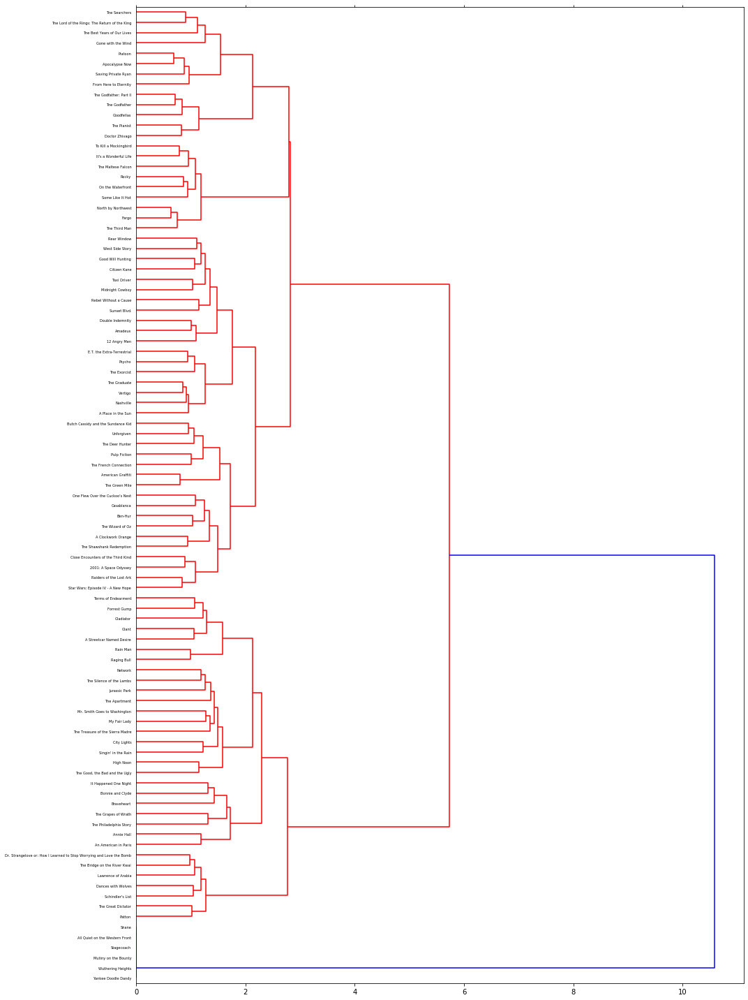

In [46]:
from scipy.cluster.hierarchy import ward, dendrogram

linkage_matrix = ward(dist) #define the linkage_matrix using ward clustering pre-computed distances

fig, ax = plt.subplots(figsize=(15, 20)) # set size
ax = dendrogram(linkage_matrix, orientation="right", labels=list(title_and_cluster['title']));

plt.tick_params(\
    axis= 'x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom='off',      # ticks along the bottom edge are off
    top='off',         # ticks along the top edge are off
    labelbottom='off')

plt.tight_layout() #show plot with tight layout

#uncomment below to save figure
#plt.savefig('ward_clusters.png', dpi=200) #save figure as ward_clusters

## Step 4: Plotting of the conseguences of tokenize and stemming

In [47]:
import numpy as np
from os import path
from PIL import Image
import matplotlib.pyplot as plt

In [48]:
pip install wordcloud

Note: you may need to restart the kernel to use updated packages.


In [49]:
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

In [50]:
file_movies = 'greatest_movies.xlsx'
greatest_movies = pd.read_excel(file_movies)

greatest_movies.index.name = 'index'
greatest_movies = greatest_movies.drop(columns = ['Unnamed: 0'])

list_synopsis = []

for movie_id in tqdm(greatest_movies['id']): #movie_id = id of each film
    
    with open(os.path.join('Best 100 film\'s synopsis/','{title}.txt'.format(title = movie_id)),'r') as file:  
        list_synopsis.append(file.read()) 

100%|██████████| 100/100 [00:01<00:00, 79.42it/s]


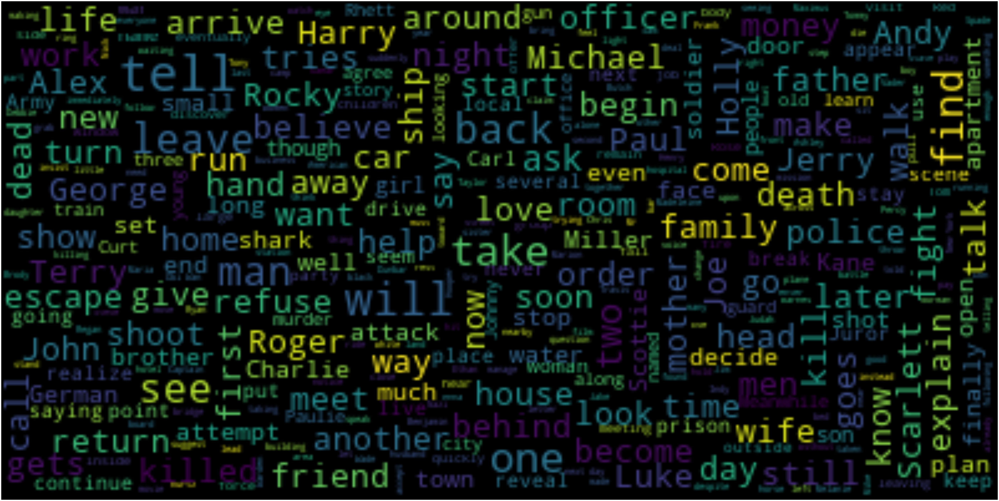

In [51]:
text =  ', '.join(list_synopsis)

wordcloud = WordCloud(max_font_size=20, max_words=100000, background_color="black").generate(text)

# Display the generated image:
plt.figure(figsize=[100,100])
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

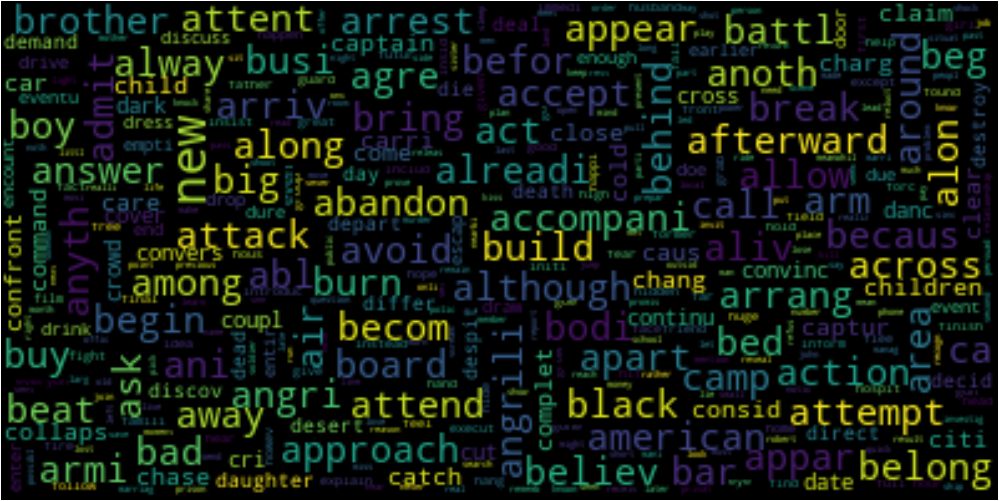

In [52]:
text =  ', '.join(list(df_merge.columns))

wordcloud = WordCloud(max_font_size=20, max_words=100000, background_color="black").generate(text)

# Display the generated image:
plt.figure(figsize=[100,100])
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.show()

<font color='red'>**Comment:**</font> We can see very clearly the difference between the two list of words.

<font color='red'>**CONCLUSIONS**</font> see the end of the Notebook_2